In [29]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pathlib

import numpy as np

In [30]:
RESOURCE_DIR = pathlib.Path('../../resources/')

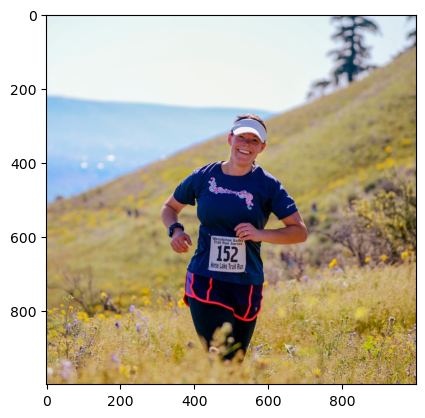

In [31]:
np_image = cv2.imread(str(RESOURCE_DIR.joinpath('pexels-frank-cone-2330502-cropped_e07fcbdc-984c-4f0a-92ab-8fd298a6101d.jpg')))
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB)
np_image = cv2.resize(np_image, dsize=(1000,1000))
plt.imshow(np_image)
plt.show()

In [32]:
np_image.shape

(1000, 1000, 3)

In [33]:
from itertools import product

In [34]:
np_image.shape[0]

1000

In [35]:
def sliding_window(image, step: int, ws):
    for y, x in product(range(0, image.shape[0] - ws[1] + 1, step), range(0, image.shape[1] - ws[0]+1, step)):
        yield (x, y, image[y:y+ws[1], x:x+ws[0]])        

In [36]:
windows = sliding_window(np_image, 200, (200,200))

/tmp/ipykernel_20150/1261329192.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f,  axarr = plt.subplots(1,2,  figsize=(12,6))


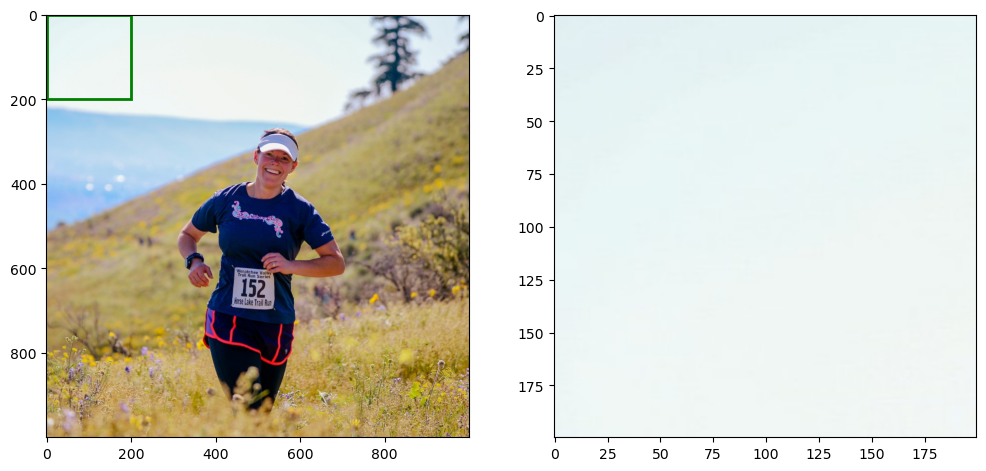

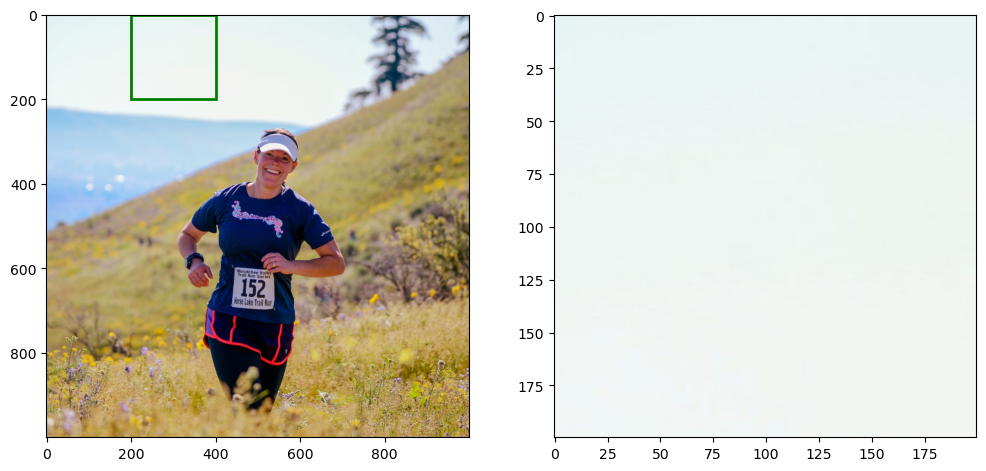

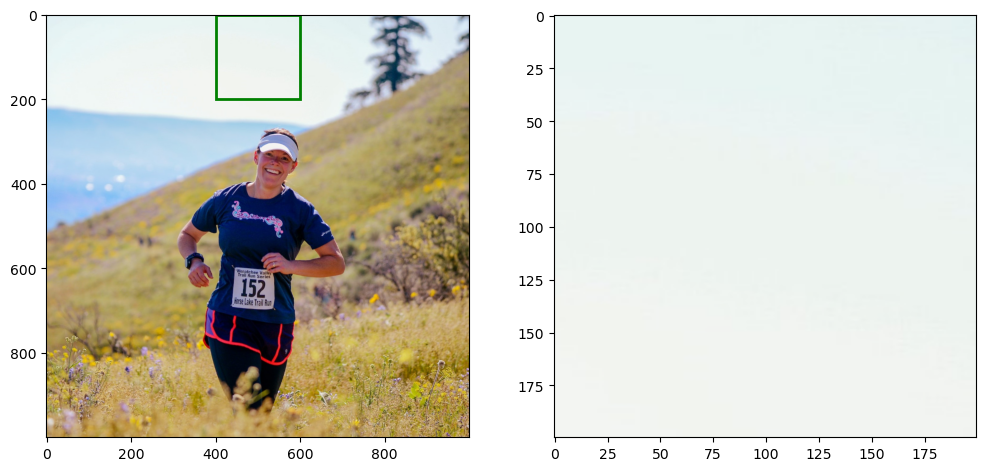

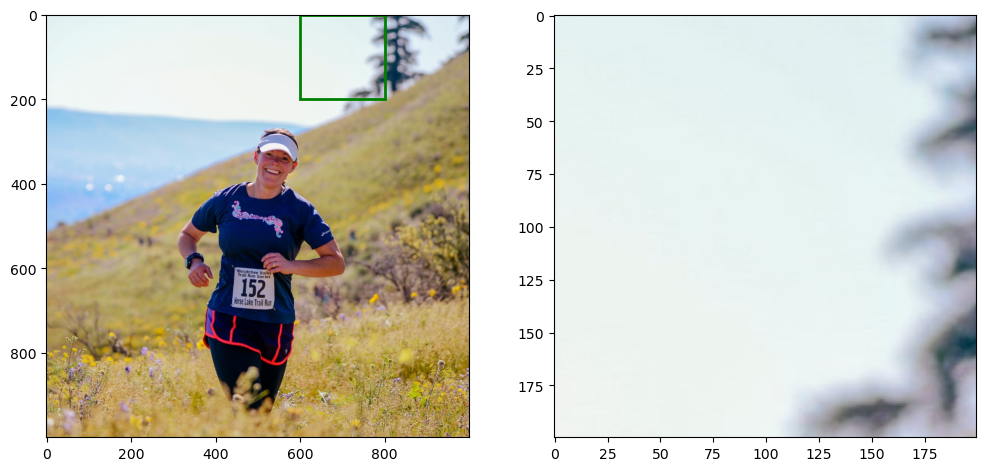

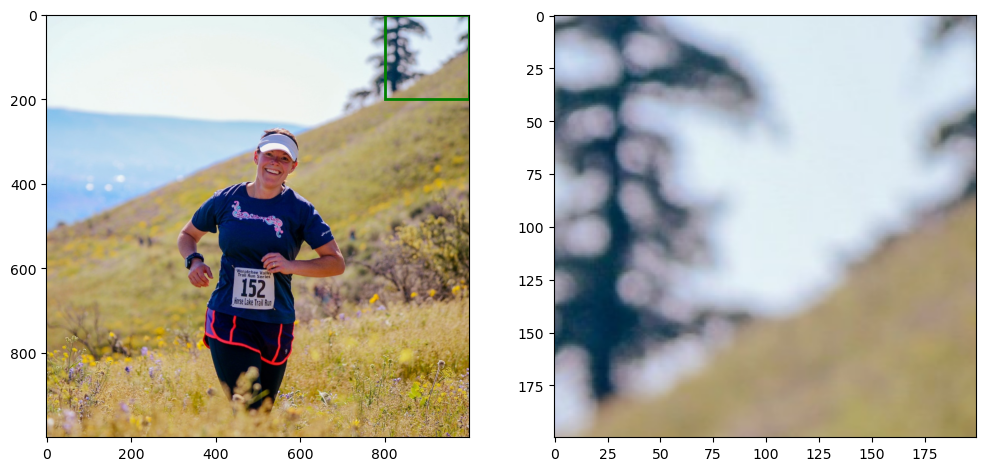

...

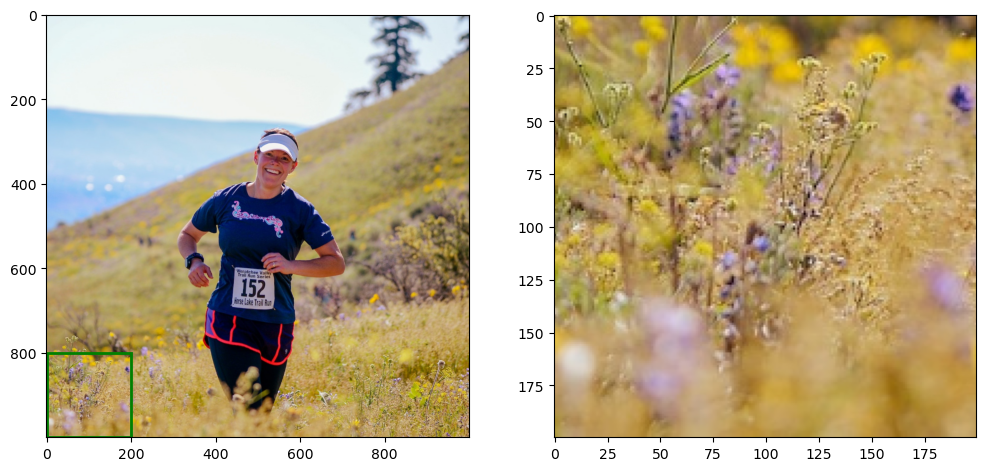

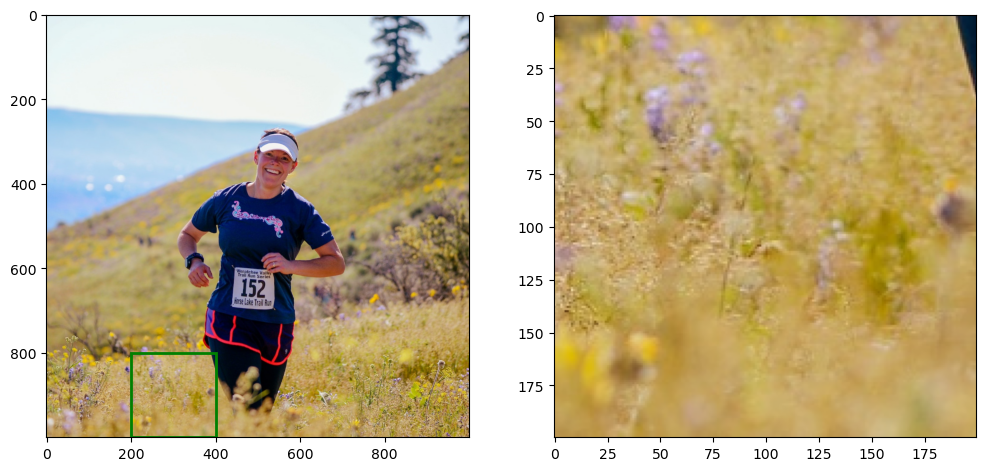

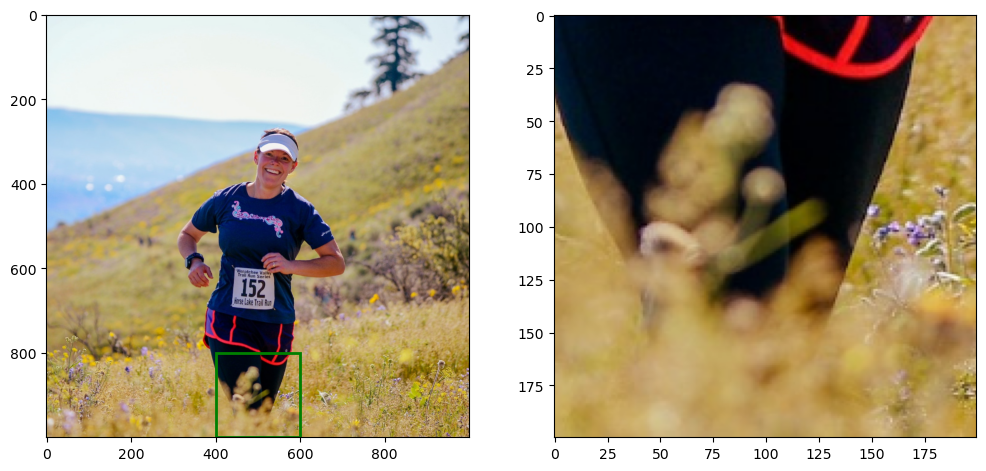

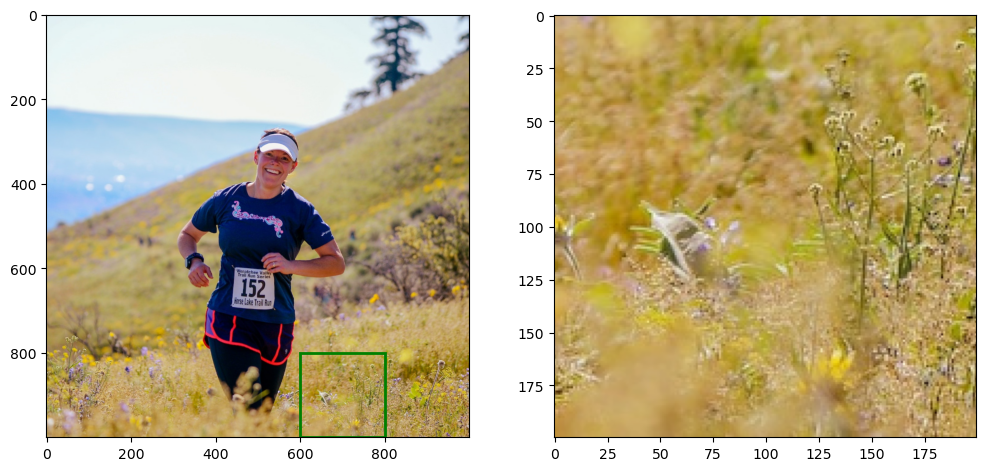

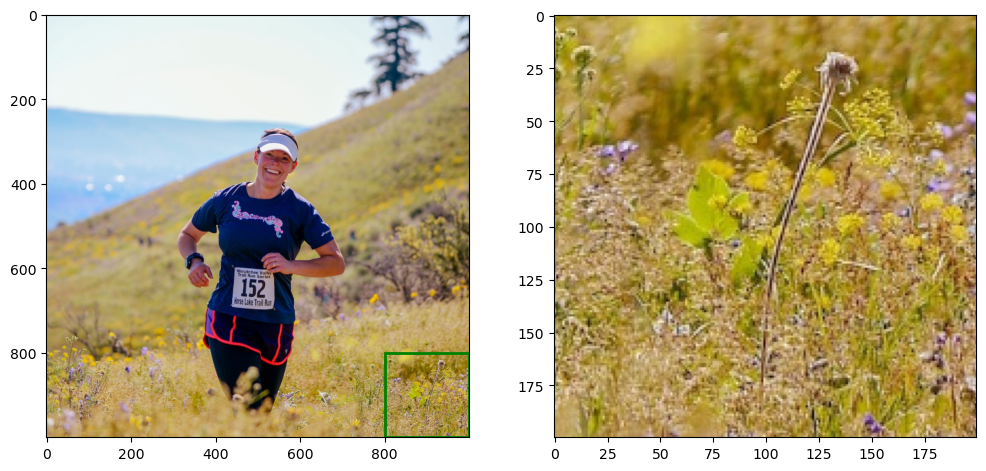

In [37]:
for x, window in enumerate(windows):
    f,  axarr = plt.subplots(1,2,  figsize=(12,6))
    *coords, window_image = window
    # print(coords)
    axarr[0].imshow(np_image)
    rect = patches.Rectangle(coords, width=window_image.shape[0],height=window_image.shape[1], linewidth=2, edgecolor='green', facecolor='none')
    axarr[0].add_patch(rect)
    axarr[1].imshow(window_image)
    f.savefig(str(RESOURCE_DIR.joinpath("img",f"{str(x)}.png",)), dpi=f.dpi)
    plt.gcf()

In [38]:
plt.close()

In [39]:
IMG_DIR = RESOURCE_DIR.joinpath('img').resolve()

images = IMG_DIR.iterdir()
images = sorted(images, key=lambda x: int(x.stem))
frames = [cv2.imread(str(img)) for img in images]
height, width, layer = frames[0].shape

In [42]:
fourcc = cv2.VideoWriter_fourcc(*'AVC1')
video_name = str(RESOURCE_DIR.joinpath('video.mp4'))
video = cv2.VideoWriter(video_name, fourcc, 1, (width, height))

OpenCV: FFMPEG: tag 0x31435641/'AVC1' is not supported with codec id 27 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x31637661/'avc1'


In [43]:
for img in frames:
    video.write(img)
video.release()

# Métricas de Object Detection

In [44]:
import numpy as np

In [ ]:
def bb_intersection_over_union(ground_truth_bbox, predicted_bbox):
    xA = max(ground_truth_bbox[0], predicted_bbox[0])
    yA = max(ground_truth_bbox[1], predicted_bbox[1])
    xB = max(ground_truth_bbox[2], predicted_bbox[2])
    yB = max(ground_truth_bbox[3], predicted_bbox[3])

    intersection_area = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    ground_truth_bbox_area = (ground_truth_bbox[2] - ground_truth_bbox[0] + 1) * (ground_truth_bbox[3] - ground_truth_bbox[1] + 1 )

    predicted_bbox_area = (predicted_bbox[2] - predicted_bbox[0] + 1) * (predicted_bbox[3] - predicted_bbox[1] + 1)

    iou = intersection_area / float(ground_truth_bbox_area + predicted_bbox_area - intersection_area)

    return iou